<a href="https://colab.research.google.com/github/Natthaphatz007/Aj.Ya/blob/main/Data_Preprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Data

In [1]:
import pandas as pd
import numpy as np

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import os
os.chdir('/content/drive/MyDrive/Data prepare & Data Mining/bsc_dpdm24_data')

!pwd # เช็ค path ที่กำลังทำงานอยู่

/content/drive/.shortcut-targets-by-id/15KgqkzRScB-aoMFE0ad-R54sgFC-z7xp/bsc_dpdm24_data


In [4]:
unit_type_data = pd.read_csv("/content/drive/MyDrive/Data prepare & Data Mining/bsc_dpdm24_data/opendata_unittype.csv")

In [5]:
unit_type_data.head()

,row_number,unittype_id,project_id,name_th,propertytype_id,propertytype_name_en,propertytype_name_th,area_total_min_wa,area_usable_min,price_min,...,count_room_kitchen,count_room_living,count_room_maid,count_room_storage,count_room_utility,date_created,date_updated,source,url_unittype,day
0,4441,unittype_11075,project_3853,4 Bedroom,2,Condo,คอนโด,NaN,250.0,50200000.0,...,NaN,NaN,NaN,NaN,NaN,2021-11-12 13:20:56,2020-10-14 00:57:57,baania,https://baania.com/th/project/โดมัส-16-3853/4-...,2023-08-31
1,28021,unittype_18174,project_7334,ทาวน์โฮมสองชั้น,3,Townhome,ทาวน์โฮม,NaN,132.0,3666666.0,...,NaN,1.0,NaN,NaN,NaN,2020-12-04 10:37:28,2020-10-14 00:43:47,baania,https://baania.com/th/project/บ้านเมฆธารา-2-73...,2023-08-31
2,14541,unittype_35595,project_15267,1 Bedroom,2,Condo,คอนโด,NaN,45.0,3250000.0,...,NaN,NaN,NaN,NaN,NaN,2021-11-12 13:20:30,2020-10-14 00:55:24,baania,https://baania.com/th/project/เดอะ-เซสท์-ลาดพร...,2023-08-31
3,21478,6305c503713e23001a6a67b3,6305c4af713e23001a6a67af,1 Bedroom,2,Condo,คอนโด,NaN,25.0,989000.0,...,NaN,NaN,NaN,NaN,NaN,2023-05-31 14:30:02,2023-05-31 14:13:32,baania,https://baania.com/th/project/เสนาคิทท์-บางนา-...,2023-08-31
4,11573,unittype_34957,project_5556,บ้านเดี่ยว SB2,1,Detached House,บ้าน,NaN,80.0,2140000.0,...,1.0,1.0,NaN,NaN,NaN,2023-03-23 12:00:05,2023-03-23 11:41:33,baania,https://baania.com/th/project/วี-อไลฟ์-ลำลูกกา...,2023-08-31


In [ ]:
unit_type_data.shape

(43963, 28)

In [ ]:
unit_type_data.columns

Index(['row_number', 'unittype_id', 'project_id', 'name_th', 'propertytype_id',
       'propertytype_name_en', 'propertytype_name_th', 'area_total_min_wa',
       'area_usable_min', 'price_min', 'count_airconditioner',
       'count_elevator', 'count_floor_internal', 'count_parking',
       'count_room_bath', 'count_room_bed', 'count_room_dinning',
       'count_room_guest', 'count_room_kitchen', 'count_room_living',
       'count_room_maid', 'count_room_storage', 'count_room_utility',
       'date_created', 'date_updated', 'source', 'url_unittype', 'day'],
      dtype='object')

# Cleaning Data

## Missing (incomplete) Data

In [ ]:
unit_type_data.isnull().any()

,0
row_number,False
unittype_id,False
project_id,False
name_th,False
propertytype_id,False
propertytype_name_en,False
propertytype_name_th,False
area_total_min_wa,False
area_usable_min,True
price_min,True


In [ ]:
print(f'{unit_type_data.dropna(subset="area_total_min_wa").shape[0]*100/unit_type_data.shape[0]:.2f}% left')

6.87% left


In [ ]:
set(unit_type_data.dropna(subset='area_total_min_wa')['propertytype_name_th'])

{'ทาวน์โฮม', 'ที่ดิน', 'บ้าน', 'บ้านแฝด', 'อาคารพาณิชย์', 'โฮมออฟฟิศ'}

## HW1
เติม พื้นที่บ้านเป็น ตารางวา จาก พื้นที่ใช้สอย เป็น ตารางเมตร เฉพาะข้อมูล คอนโด


เขียนว่า ข้อมูลอสังหาฯอื่นๆ ควรจะเติมพื้นที่บ้านยังไง.

In [ ]:
unit_type_data = pd.read_csv("/content/drive/MyDrive/Data prepare & Data Mining/bsc_dpdm24_data/opendata_unittype.csv")
unit_type_data

,row_number,unittype_id,project_id,name_th,propertytype_id,propertytype_name_en,propertytype_name_th,area_total_min_wa,area_usable_min,price_min,...,count_room_kitchen,count_room_living,count_room_maid,count_room_storage,count_room_utility,date_created,date_updated,source,url_unittype,day
0,4441,unittype_11075,project_3853,4 Bedroom,2,Condo,คอนโด,NaN,250.0,50200000.0,...,NaN,NaN,NaN,NaN,NaN,2021-11-12 13:20:56,2020-10-14 00:57:57,baania,https://baania.com/th/project/โดมัส-16-3853/4-...,2023-08-31
1,28021,unittype_18174,project_7334,ทาวน์โฮมสองชั้น,3,Townhome,ทาวน์โฮม,NaN,132.0,3666666.0,...,NaN,1.0,NaN,NaN,NaN,2020-12-04 10:37:28,2020-10-14 00:43:47,baania,https://baania.com/th/project/บ้านเมฆธารา-2-73...,2023-08-31
2,14541,unittype_35595,project_15267,1 Bedroom,2,Condo,คอนโด,NaN,45.0,3250000.0,...,NaN,NaN,NaN,NaN,NaN,2021-11-12 13:20:30,2020-10-14 00:55:24,baania,https://baania.com/th/project/เดอะ-เซสท์-ลาดพร...,2023-08-31
3,21478,6305c503713e23001a6a67b3,6305c4af713e23001a6a67af,1 Bedroom,2,Condo,คอนโด,NaN,25.0,989000.0,...,NaN,NaN,NaN,NaN,NaN,2023-05-31 14:30:02,2023-05-31 14:13:32,baania,https://baania.com/th/project/เสนาคิทท์-บางนา-...,2023-08-31
4,11573,unittype_34957,project_5556,บ้านเดี่ยว SB2,1,Detached House,บ้าน,NaN,80.0,2140000.0,...,1.0,1.0,NaN,NaN,NaN,2023-03-23 12:00:05,2023-03-23 11:41:33,baania,https://baania.com/th/project/วี-อไลฟ์-ลำลูกกา...,2023-08-31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43958,24030,64a69b679ac98e00137baccc,64a69aa99ac98e00137bacc5,บ้านเดี่ยวชั้นเดียว,1,Detached House,บ้าน,NaN,80.0,NaN,...,NaN,NaN,NaN,NaN,NaN,2023-07-13 18:30:02,2023-07-13 18:08:11,baania,https://baania.com/th/project/พาราวิลล์-7-64a6...,2023-08-31
43959,27439,unittype_13626,project_5336,1 Bedroom,2,Condo,คอนโด,NaN,32.0,1900000.0,...,NaN,NaN,NaN,NaN,NaN,2021-11-12 13:33:33,2021-07-15 15:18:28,baania,https://baania.com/th/project/เวนโต้-คอนโด-เกษ...,2023-08-31
43960,1780,unittype_5858,project_1921,Delux Type E,2,Condo,คอนโด,NaN,35.0,1870000.0,...,1.0,1.0,NaN,NaN,NaN,2022-10-17 12:00:18,2022-10-17 11:51:21,baania,https://baania.com/th/project/ริเวนเดลล์-แอปโซ...,2023-08-31
43961,19135,60c0850ce5834700138692ac,project_13885,1 Bedroom Plus,2,Condo,คอนโด,NaN,30.5,2490000.0,...,NaN,NaN,NaN,NaN,1.0,2023-06-12 14:30:03,2023-06-12 14:15:31,baania,https://baania.com/th/project/เคนซิงตัน-สุขุมว...,2023-08-31


In [ ]:
# Conversion factors for specific property types
conversion_factors = {
    'คอนโด': 4.0,          # 1 ตารางวา = 4 ตารางเมตร
    'บ้าน': 3.5,
    'บ้านแฝด': 3.5,
    'ทาวน์โฮม': 3.0,
    'อาคารพาณิชย์': 4.0,  # Adjust as needed
    'โฮมออฟฟิศ': 3.8,    # Adjust as needed
    'ที่ดิน': None         # May not require a conversion factor
}

# Define the function to calculate area in wah
def calculate_area_in_wah(area_sqm, factor):
    """Calculates area in square wah given area in square meters and a conversion factor."""
    if area_sqm is not None and factor is not None:
        return area_sqm / factor
    else:
        return None  # or handle as you see fit for missing values
# Apply the conversion factors
for property_type, factor in conversion_factors.items():
    if factor is not None:
        unit_type_data.loc[unit_type_data['propertytype_name_th'] == property_type, 'area_total_min_wa'] = \
            unit_type_data[unit_type_data['propertytype_name_th'] == property_type]['area_usable_min'].apply(
                lambda x: calculate_area_in_wah(x, factor)
            )

# Handle missing 'area_total_min_wa' using median for each property type
# หาค่ามัธยฐานและปัดเศษเป็นทศนิยม 2 ตำแหน่ง
grouped_median = unit_type_data.groupby('propertytype_name_th')['area_total_min_wa'].median().round(2)

# แทนที่ค่าที่หายไปด้วยค่ามัธยฐานที่ปัดเศษแล้ว
unit_type_data['area_total_min_wa'] = unit_type_data.apply(
    lambda row: grouped_median[row['propertytype_name_th']] if pd.isnull(row['area_total_min_wa']) else row['area_total_min_wa'],
    axis=1
)

# for checking missing Data
unit_type_data['area_total_min_wa_missing'] = unit_type_data['area_total_min_wa'].isnull()

# Print summary message
message = (
    "พื้นที่รวมสำหรับแต่ละประเภทอสังหาริมทรัพย์ถูกเติมข้อมูลดังนี้:\n"
    "- *คอนโด: ใช้ค่าแปลง 4 ตารางเมตร = 1 ตารางวา\n"
    "- บ้าน, บ้านแฝด: ใช้ค่าแปลง 3.5 ตารางเมตร = 1 ตารางวา\n"
    "- ทาวน์โฮม: ใช้ค่าแปลง 3 ตารางเมตร = 1 ตารางวา\n"
    "- อาคารพาณิชย์: ใช้ค่าแปลง 4 ตารางเมตร = 1 ตารางวา\n"
    "- โฮมออฟฟิศ: ใช้ค่าแปลง 3.8 ตารางเมตร = 1 ตารางวา\n"
    "- ที่ดิน: ใช้ค่ามัธยฐานเติมข้อมูลในกรณีที่ไม่มีข้อมูลพื้นที่รวม"
)
print(message)
print(f'จำนวนข้อมูลที่สูญหาย : {(unit_type_data["area_total_min_wa_missing"] == True).sum()}')
unit_type_data

พื้นที่รวมสำหรับแต่ละประเภทอสังหาริมทรัพย์ถูกเติมข้อมูลดังนี้:
- *คอนโด: ใช้ค่าแปลง 4 ตารางเมตร = 1 ตารางวา
- บ้าน, บ้านแฝด: ใช้ค่าแปลง 3.5 ตารางเมตร = 1 ตารางวา
- ทาวน์โฮม: ใช้ค่าแปลง 3 ตารางเมตร = 1 ตารางวา
- อาคารพาณิชย์: ใช้ค่าแปลง 4 ตารางเมตร = 1 ตารางวา
- โฮมออฟฟิศ: ใช้ค่าแปลง 3.8 ตารางเมตร = 1 ตารางวา
- ที่ดิน: ใช้ค่ามัธยฐานเติมข้อมูลในกรณีที่ไม่มีข้อมูลพื้นที่รวม
จำนวนข้อมูลที่สูญหาย : 93


,row_number,unittype_id,project_id,name_th,propertytype_id,propertytype_name_en,propertytype_name_th,area_total_min_wa,area_usable_min,price_min,...,count_room_living,count_room_maid,count_room_storage,count_room_utility,date_created,date_updated,source,url_unittype,day,area_total_min_wa_missing
0,4441,unittype_11075,project_3853,4 Bedroom,2,Condo,คอนโด,62.500000,250.0,50200000.0,...,NaN,NaN,NaN,NaN,2021-11-12 13:20:56,2020-10-14 00:57:57,baania,https://baania.com/th/project/โดมัส-16-3853/4-...,2023-08-31,False
1,28021,unittype_18174,project_7334,ทาวน์โฮมสองชั้น,3,Townhome,ทาวน์โฮม,44.000000,132.0,3666666.0,...,1.0,NaN,NaN,NaN,2020-12-04 10:37:28,2020-10-14 00:43:47,baania,https://baania.com/th/project/บ้านเมฆธารา-2-73...,2023-08-31,False
2,14541,unittype_35595,project_15267,1 Bedroom,2,Condo,คอนโด,11.250000,45.0,3250000.0,...,NaN,NaN,NaN,NaN,2021-11-12 13:20:30,2020-10-14 00:55:24,baania,https://baania.com/th/project/เดอะ-เซสท์-ลาดพร...,2023-08-31,False
3,21478,6305c503713e23001a6a67b3,6305c4af713e23001a6a67af,1 Bedroom,2,Condo,คอนโด,6.250000,25.0,989000.0,...,NaN,NaN,NaN,NaN,2023-05-31 14:30:02,2023-05-31 14:13:32,baania,https://baania.com/th/project/เสนาคิทท์-บางนา-...,2023-08-31,False
4,11573,unittype_34957,project_5556,บ้านเดี่ยว SB2,1,Detached House,บ้าน,22.857143,80.0,2140000.0,...,1.0,NaN,NaN,NaN,2023-03-23 12:00:05,2023-03-23 11:41:33,baania,https://baania.com/th/project/วี-อไลฟ์-ลำลูกกา...,2023-08-31,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43958,24030,64a69b679ac98e00137baccc,64a69aa99ac98e00137bacc5,บ้านเดี่ยวชั้นเดียว,1,Detached House,บ้าน,22.857143,80.0,NaN,...,NaN,NaN,NaN,NaN,2023-07-13 18:30:02,2023-07-13 18:08:11,baania,https://baania.com/th/project/พาราวิลล์-7-64a6...,2023-08-31,False
43959,27439,unittype_13626,project_5336,1 Bedroom,2,Condo,คอนโด,8.000000,32.0,1900000.0,...,NaN,NaN,NaN,NaN,2021-11-12 13:33:33,2021-07-15 15:18:28,baania,https://baania.com/th/project/เวนโต้-คอนโด-เกษ...,2023-08-31,False
43960,1780,unittype_5858,project_1921,Delux Type E,2,Condo,คอนโด,8.750000,35.0,1870000.0,...,1.0,NaN,NaN,NaN,2022-10-17 12:00:18,2022-10-17 11:51:21,baania,https://baania.com/th/project/ริเวนเดลล์-แอปโซ...,2023-08-31,False
43961,19135,60c0850ce5834700138692ac,project_13885,1 Bedroom Plus,2,Condo,คอนโด,7.625000,30.5,2490000.0,...,NaN,NaN,NaN,1.0,2023-06-12 14:30:03,2023-06-12 14:15:31,baania,https://baania.com/th/project/เคนซิงตัน-สุขุมว...,2023-08-31,False


In [ ]:
#checking NaN in area_total_min_wa_missing
nan_rows = unit_type_data[unit_type_data['area_total_min_wa'].isnull()] # use the boolean Series to filter the DataFrame
nan_rows['propertytype_name_th'] # display the rows with NaN

,propertytype_name_th
55,อพาตเมนต์
779,โรงแรม
1185,โกดัง / โรงงาน
1903,โรงแรม
2797,อพาตเมนต์
...,...
41866,อพาตเมนต์
41876,อพาตเมนต์
42957,โรงแรม
43679,โรงแรม


In [ ]:
#clear NaN data (without condominium data)
# เพราะใช้แค่ข้อมูลคอนโด กรณีมี missing อาจจะเป็น propertytype อื่น เลยทำการ clear ออกทั้งหมดหลังจากที่คำนวณของ condo เรียบร้อยแล้ว
unit_type_data = unit_type_data.dropna(subset=['area_total_min_wa'])
unit_type_data

,row_number,unittype_id,project_id,name_th,propertytype_id,propertytype_name_en,propertytype_name_th,area_total_min_wa,area_usable_min,price_min,...,count_room_living,count_room_maid,count_room_storage,count_room_utility,date_created,date_updated,source,url_unittype,day,area_total_min_wa_missing
0,4441,unittype_11075,project_3853,4 Bedroom,2,Condo,คอนโด,62.500000,250.0,50200000.0,...,NaN,NaN,NaN,NaN,2021-11-12 13:20:56,2020-10-14 00:57:57,baania,https://baania.com/th/project/โดมัส-16-3853/4-...,2023-08-31,False
1,28021,unittype_18174,project_7334,ทาวน์โฮมสองชั้น,3,Townhome,ทาวน์โฮม,44.000000,132.0,3666666.0,...,1.0,NaN,NaN,NaN,2020-12-04 10:37:28,2020-10-14 00:43:47,baania,https://baania.com/th/project/บ้านเมฆธารา-2-73...,2023-08-31,False
2,14541,unittype_35595,project_15267,1 Bedroom,2,Condo,คอนโด,11.250000,45.0,3250000.0,...,NaN,NaN,NaN,NaN,2021-11-12 13:20:30,2020-10-14 00:55:24,baania,https://baania.com/th/project/เดอะ-เซสท์-ลาดพร...,2023-08-31,False
3,21478,6305c503713e23001a6a67b3,6305c4af713e23001a6a67af,1 Bedroom,2,Condo,คอนโด,6.250000,25.0,989000.0,...,NaN,NaN,NaN,NaN,2023-05-31 14:30:02,2023-05-31 14:13:32,baania,https://baania.com/th/project/เสนาคิทท์-บางนา-...,2023-08-31,False
4,11573,unittype_34957,project_5556,บ้านเดี่ยว SB2,1,Detached House,บ้าน,22.857143,80.0,2140000.0,...,1.0,NaN,NaN,NaN,2023-03-23 12:00:05,2023-03-23 11:41:33,baania,https://baania.com/th/project/วี-อไลฟ์-ลำลูกกา...,2023-08-31,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43958,24030,64a69b679ac98e00137baccc,64a69aa99ac98e00137bacc5,บ้านเดี่ยวชั้นเดียว,1,Detached House,บ้าน,22.857143,80.0,NaN,...,NaN,NaN,NaN,NaN,2023-07-13 18:30:02,2023-07-13 18:08:11,baania,https://baania.com/th/project/พาราวิลล์-7-64a6...,2023-08-31,False
43959,27439,unittype_13626,project_5336,1 Bedroom,2,Condo,คอนโด,8.000000,32.0,1900000.0,...,NaN,NaN,NaN,NaN,2021-11-12 13:33:33,2021-07-15 15:18:28,baania,https://baania.com/th/project/เวนโต้-คอนโด-เกษ...,2023-08-31,False
43960,1780,unittype_5858,project_1921,Delux Type E,2,Condo,คอนโด,8.750000,35.0,1870000.0,...,1.0,NaN,NaN,NaN,2022-10-17 12:00:18,2022-10-17 11:51:21,baania,https://baania.com/th/project/ริเวนเดลล์-แอปโซ...,2023-08-31,False
43961,19135,60c0850ce5834700138692ac,project_13885,1 Bedroom Plus,2,Condo,คอนโด,7.625000,30.5,2490000.0,...,NaN,NaN,NaN,1.0,2023-06-12 14:30:03,2023-06-12 14:15:31,baania,https://baania.com/th/project/เคนซิงตัน-สุขุมว...,2023-08-31,False


In [ ]:
# Final Check
if unit_type_data['area_total_min_wa'].isnull().sum() == 0:
  print('No missing data available')
else:
    print('Missing data have available')

No missing data available


## class

In [9]:
drive.flush_and_unmount()

Drive not mounted, so nothing to flush and unmount.


In [10]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [12]:
import os
os.chdir('/content')

In [13]:
!pip install ydata-profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.9/390.9 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 18.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 29.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 78.4 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=dd4262d2110784962dc8e2141585eb7326bc440cda9aad058112b87bd6ea9739
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [15]:
from ydata_profiling import ProfileReport

In [16]:
ProfileReport(unit_type_data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Missing Data

# ข้อมูลบางส่วนมีค่าตัวแปรบางตัวที่ไม่ทราบค่า (Missing Data)

## Example

In [ ]:
unit_type_data.isnull().any()

,0
row_number,False
unittype_id,False
project_id,False
name_th,False
propertytype_id,False
propertytype_name_en,False
propertytype_name_th,False
area_total_min_wa,True
area_usable_min,True
price_min,True


#### ตรวจสอบค่า ก่อนการ missing

## Fix

In [ ]:
new_shopping_data

,invoice_no,customer_id,gender,age,category,quantity,price,payment_method,invoice_date,shopping_mall
2,I127801,C266599,Male,20,Clothing,1,NaN,Cash,9/11/2021,Metrocity
382,I591015,C286181,Female,69,Clothing,1,NaN,Cash,12/9/2021,Metrocity
446,I423124,C109593,Female,66,Clothing,1,NaN,Cash,7/1/2023,Metrocity
531,I223795,C280596,Male,40,Clothing,3,NaN,Cash,26/12/2022,Metrocity
647,I891465,C175833,Female,19,Clothing,1,NaN,Cash,21/07/2022,Metrocity
...,...,...,...,...,...,...,...,...,...,...
99452,I219422,C441542,Female,45,Souvenir,5,58.65,Credit Card,21/09/2022,Kanyon
99453,I325143,C569580,Male,27,Food & Beverage,2,10.46,Cash,22/09/2021,Forum Istanbul
99454,I824010,C103292,Male,63,Food & Beverage,2,10.46,Debit Card,28/03/2021,Metrocity
99455,I702964,C800631,Male,56,Technology,4,4200.00,Cash,16/03/2021,Istinye Park


In [ ]:
new_shopping_data.isnull().any()

invoice_no        False
customer_id       False
gender            False
age               False
category          False
quantity          False
price              True
payment_method    False
invoice_date      False
shopping_mall     False
dtype: bool

## HW2

#### 1. Ignore Missing (ลบออกไปเลย)


*   Data หายไปกี่ %
*   mean data รวมหลังจากแก้ missing เป็นเท่าไหร่



In [19]:
unit_type_data.describe()

,row_number,propertytype_id,area_total_min_wa,area_usable_min,price_min,count_airconditioner,count_elevator,count_floor_internal,count_parking,count_room_bath,count_room_bed,count_room_dinning,count_room_guest,count_room_kitchen,count_room_living,count_room_maid,count_room_storage,count_room_utility
count,43963.000000,43963.000000,3022.000000,38646.000000,3.542700e+04,1756.000000,0.0,30918.000000,24969.000000,42336.000000,42134.000000,13427.000000,12747.000000,20057.000000,10033.000000,2133.000000,4014.000000,929.000000
mean,21982.000000,1074.935286,44.792075,141.508452,5.606286e+06,2.457859,NaN,1.957630,1.868277,2.340018,2.555229,1.002085,1.012081,1.018248,1.059803,1.052039,1.055057,1.052745
std,12691.169279,4500.888396,21.859977,115.120611,1.142832e+07,1.500974,NaN,0.645006,0.769121,1.195662,1.163012,0.047224,0.112089,0.135332,0.276347,0.236476,0.271052,0.263464
min,1.000000,1.000000,1.000000,0.030000,1.000000e+05,1.000000,NaN,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,10991.500000,1.000000,23.000000,60.500000,1.950000e+06,1.000000,NaN,2.000000,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
50%,21982.000000,2.000000,50.000000,126.360000,3.150000e+06,2.000000,NaN,2.000000,2.000000,2.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
75%,32972.500000,3.000000,60.000000,180.000000,5.300000e+06,3.000000,NaN,2.000000,2.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,43963.000000,20000.000000,335.000000,4350.000000,5.800000e+08,10.000000,NaN,9.000000,10.000000,66.000000,10.000000,3.000000,3.000000,3.000000,5.000000,4.000000,5.000000,4.000000


In [ ]:
unit_type_data_drop = unit_type_data.dropna()

In [ ]:
print(f'{unit_type_data_drop.shape[0]*100/unit_type_data.shape[0]:.2f}% left')

0.00% left


In [20]:
unit_type_data_drop.describe()

,row_number,propertytype_id,area_total_min_wa,area_usable_min,price_min,count_airconditioner,count_elevator,count_floor_internal,count_parking,count_room_bath,count_room_bed,count_room_dinning,count_room_guest,count_room_kitchen,count_room_living,count_room_maid,count_room_storage,count_room_utility
count,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### 1.2 เราสนใจเฉพาะ Columns (unittype_id, project_id, name_th,propertytype_name_th,area_total_min_wa, area_usable_min price_min, source, url_unittype)

In [21]:
selected = ['unittype_id', 'project_id', 'name_th', 'propertytype_name_th', 'area_total_min_wa', 'area_usable_min', 'price_min', 'source', 'url_unittype']

In [22]:
unit_type_data_drop_subset = unit_type_data.dropna(subset=selected)
unit_type_data_drop_subset

,row_number,unittype_id,project_id,name_th,propertytype_id,propertytype_name_en,propertytype_name_th,area_total_min_wa,area_usable_min,price_min,...,count_room_kitchen,count_room_living,count_room_maid,count_room_storage,count_room_utility,date_created,date_updated,source,url_unittype,day
5,8741,unittype_1672,project_868,บ้านธารธารา,1,Detached House,บ้าน,47.0,80.0,3300000.0,...,1.0,NaN,NaN,NaN,NaN,2022-01-28 11:30:04,2022-01-28 11:27:16,baania,https://baania.com/th/project/สมหวังพร็อพเพอร์...,2023-08-31
19,1091,unittype_611,project_195,บ้านพิมพ์ลาวัลย์,1,Detached House,บ้าน,56.0,110.0,2114000.0,...,NaN,NaN,NaN,NaN,NaN,2021-11-12 13:23:39,2020-10-14 21:12:50,baania,https://baania.com/th/project/บ้านปรารถนาพลัส-...,2023-08-31
48,32130,unittype_33718,project_14438,บ้านเดี่ยวสองชั้น,1,Detached House,บ้าน,75.0,165.0,4500000.0,...,NaN,NaN,NaN,NaN,NaN,2021-11-12 13:23:54,2020-10-14 22:08:52,baania,https://baania.com/th/project/บ้านสิรินาคร-144...,2023-08-31
50,9901,unittype_4131,project_1341,Dream 3 Modern,1,Detached House,บ้าน,88.0,149.0,2790000.0,...,1.0,NaN,NaN,NaN,NaN,2021-11-12 13:27:31,2021-01-07 14:34:49,baania,https://baania.com/th/project/ณิชากู๊ดวิลล์-13...,2023-08-31
70,37485,unittype_23888,project_9538,อาคารพาณิชย์สามชั้น,4,Commercial,อาคารพาณิชย์,21.4,144.0,4590000.0,...,NaN,NaN,NaN,NaN,NaN,2021-11-12 13:33:10,2021-07-05 12:08:25,baania,https://baania.com/th/project/คริสตัล-ทาวน์-95...,2023-08-31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43836,31431,unittype_13841,project_5448,บ้านเดี่ยวสองชั้น Type A,1,Detached House,บ้าน,44.0,159.0,3300000.0,...,NaN,1.0,NaN,NaN,NaN,2021-11-12 13:28:35,2021-01-13 10:52:21,baania,https://baania.com/th/project/บ้านปรารถนา-พาวิ...,2023-08-31
43888,28941,unittype_25661,project_10261,เรือนพราวนภา,1,Detached House,บ้าน,8.0,235.0,6630000.0,...,1.0,NaN,NaN,2.0,NaN,2021-11-12 13:24:29,2020-10-14 23:35:07,baania,https://baania.com/th/project/บ้านศุมิตรารมย์-...,2023-08-31
43893,8618,unittype_437,project_128,Alpes,1,Detached House,บ้าน,50.0,148.0,4300000.0,...,NaN,NaN,NaN,NaN,NaN,2021-11-12 13:25:44,2020-11-17 16:00:36,baania,https://baania.com/th/project/วรารมย์-พรีเมี่ย...,2023-08-31
43895,13020,unittype_23916,project_9549,Cozy,3,Townhome,ทาวน์โฮม,17.4,90.0,1500000.0,...,1.0,NaN,NaN,NaN,NaN,2021-11-12 13:28:48,2021-01-13 15:18:52,baania,https://baania.com/th/project/บ้านพฤกษานารา-หน...,2023-08-31


In [23]:
print(f'{unit_type_data.dropna(subset=selected).shape[0]*100/unit_type_data.shape[0]:.2f}% left')
unit_type_data_drop_subset.describe()

5.78% left


,row_number,propertytype_id,area_total_min_wa,area_usable_min,price_min,count_airconditioner,count_elevator,count_floor_internal,count_parking,count_room_bath,count_room_bed,count_room_dinning,count_room_guest,count_room_kitchen,count_room_living,count_room_maid,count_room_storage,count_room_utility
count,2542.000000,2542.000000,2542.000000,2542.000000,2.542000e+03,61.000000,0.0,2514.000000,2224.000000,2509.000000,2495.000000,1180.0,1383.000000,1645.000000,546.000000,155.000000,789.000000,0.0
mean,21642.711644,788.463021,44.429473,174.259245,5.689395e+06,2.704918,NaN,1.940732,1.861511,2.794340,3.071743,1.0,1.007231,1.013374,1.062271,1.032258,1.027883,NaN
std,13790.769753,3888.434067,21.911747,89.536983,7.700256e+06,1.464517,NaN,0.646448,0.610062,1.002763,0.709699,0.0,0.084756,0.114904,0.270517,0.210730,0.179489,NaN
min,5.000000,1.000000,1.000000,21.000000,3.900000e+05,1.000000,NaN,1.000000,1.000000,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,NaN
25%,8825.250000,1.000000,22.925000,120.000000,2.490000e+06,1.000000,NaN,2.000000,2.000000,2.000000,3.000000,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,NaN
50%,24891.500000,1.000000,50.000000,153.000000,3.675000e+06,3.000000,NaN,2.000000,2.000000,3.000000,3.000000,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,NaN
75%,35025.250000,3.000000,60.000000,197.000000,5.522500e+06,4.000000,NaN,2.000000,2.000000,3.000000,3.000000,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,NaN
max,41242.000000,20000.000000,335.000000,850.000000,1.100000e+08,6.000000,NaN,7.000000,7.000000,9.000000,9.000000,1.0,2.000000,2.000000,4.000000,3.000000,3.000000,NaN


### 2. เติมด้วย Unknown *เราจะเติมกับข้อมูล categorical

In [24]:
unit_type_data.select_dtypes(include=['object']).columns

Index(['unittype_id', 'project_id', 'name_th', 'propertytype_name_en',
       'propertytype_name_th', 'date_created', 'date_updated', 'source',
       'url_unittype', 'day'],
      dtype='object')

In [26]:
unit_type_data_unknown = unit_type_data.copy()

In [27]:
# prompt: จะเติมกับข้อมูล categorical ด้วย unknown

# Identify categorical columns
categorical_cols = unit_type_data_unknown.select_dtypes(include=['object']).columns

# Fill missing values in categorical columns with 'Unknown'
for col in categorical_cols:
    unit_type_data_unknown[col] = unit_type_data_unknown[col].fillna('Unknown')

# Verify the changes
print(unit_type_data_unknown.isnull().sum())

row_number                  0
unittype_id                 0
project_id                  0
name_th                     0
propertytype_id             0
propertytype_name_en        0
propertytype_name_th        0
area_total_min_wa       40941
area_usable_min          5317
price_min                8536
count_airconditioner    42207
count_elevator          43963
count_floor_internal    13045
count_parking           18994
count_room_bath          1627
count_room_bed           1829
count_room_dinning      30536
count_room_guest        31216
count_room_kitchen      23906
count_room_living       33930
count_room_maid         41830
count_room_storage      39949
count_room_utility      43034
date_created                0
date_updated                0
source                      0
url_unittype                0
day                         0
dtype: int64


### 3. เติมด้วย mean

In [28]:
unit_type_data_drop_subset.describe()

,row_number,propertytype_id,area_total_min_wa,area_usable_min,price_min,count_airconditioner,count_elevator,count_floor_internal,count_parking,count_room_bath,count_room_bed,count_room_dinning,count_room_guest,count_room_kitchen,count_room_living,count_room_maid,count_room_storage,count_room_utility
count,2542.000000,2542.000000,2542.000000,2542.000000,2.542000e+03,61.000000,0.0,2514.000000,2224.000000,2509.000000,2495.000000,1180.0,1383.000000,1645.000000,546.000000,155.000000,789.000000,0.0
mean,21642.711644,788.463021,44.429473,174.259245,5.689395e+06,2.704918,NaN,1.940732,1.861511,2.794340,3.071743,1.0,1.007231,1.013374,1.062271,1.032258,1.027883,NaN
std,13790.769753,3888.434067,21.911747,89.536983,7.700256e+06,1.464517,NaN,0.646448,0.610062,1.002763,0.709699,0.0,0.084756,0.114904,0.270517,0.210730,0.179489,NaN
min,5.000000,1.000000,1.000000,21.000000,3.900000e+05,1.000000,NaN,1.000000,1.000000,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,NaN
25%,8825.250000,1.000000,22.925000,120.000000,2.490000e+06,1.000000,NaN,2.000000,2.000000,2.000000,3.000000,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,NaN
50%,24891.500000,1.000000,50.000000,153.000000,3.675000e+06,3.000000,NaN,2.000000,2.000000,3.000000,3.000000,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,NaN
75%,35025.250000,3.000000,60.000000,197.000000,5.522500e+06,4.000000,NaN,2.000000,2.000000,3.000000,3.000000,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,NaN
max,41242.000000,20000.000000,335.000000,850.000000,1.100000e+08,6.000000,NaN,7.000000,7.000000,9.000000,9.000000,1.0,2.000000,2.000000,4.000000,3.000000,3.000000,NaN


In [30]:
unit_type_data_fill_mean = unit_type_data.copy()

In [31]:
# datatype ของแต่ละ column
unit_type_data.dtypes

,0
row_number,int64
unittype_id,object
project_id,object
name_th,object
propertytype_id,int64
propertytype_name_en,object
propertytype_name_th,object
area_total_min_wa,float64
area_usable_min,float64
price_min,float64


In [32]:
# prompt:  เติมค่าว่างของ unit_type_data_fill_mean ด้วย mean ของแต่ละ column (datatype float64 )

# Select float64 columns
float_cols = unit_type_data_fill_mean.select_dtypes(include=['float64']).columns

# Fill NaN values with the mean of each column
for col in float_cols:
    mean_val = unit_type_data_fill_mean[col].mean()
    unit_type_data_fill_mean[col] = unit_type_data_fill_mean[col].fillna(mean_val)

# Verify the changes
print(unit_type_data_fill_mean.isnull().sum())

row_number                  0
unittype_id                 0
project_id                  0
name_th                     0
propertytype_id             0
propertytype_name_en        0
propertytype_name_th        0
area_total_min_wa           0
area_usable_min             0
price_min                   0
count_airconditioner        0
count_elevator          43963
count_floor_internal        0
count_parking               0
count_room_bath             0
count_room_bed              0
count_room_dinning          0
count_room_guest            0
count_room_kitchen          0
count_room_living           0
count_room_maid             0
count_room_storage          0
count_room_utility          0
date_created                0
date_updated                0
source                      0
url_unittype                0
day                         0
dtype: int64


In [33]:
# prompt: เติมค่าว่างของ unit_type_data_fill_mean ด้วย mean ของแต่ละ column

# Identify numerical columns with missing values
numerical_cols_with_missing = unit_type_data_fill_mean.select_dtypes(include=['float64']).columns[unit_type_data_fill_mean.select_dtypes(include=['float64']).isnull().any()]

# Fill missing values in numerical columns with their respective column means
for col in numerical_cols_with_missing:
    unit_type_data_fill_mean[col] = unit_type_data_fill_mean[col].fillna(unit_type_data_fill_mean[col].mean())

unit_type_data_fill_mean

,row_number,unittype_id,project_id,name_th,propertytype_id,propertytype_name_en,propertytype_name_th,area_total_min_wa,area_usable_min,price_min,...,count_room_kitchen,count_room_living,count_room_maid,count_room_storage,count_room_utility,date_created,date_updated,source,url_unittype,day
0,4441,unittype_11075,project_3853,4 Bedroom,2,Condo,คอนโด,44.792075,250.0,5.020000e+07,...,1.018248,1.059803,1.052039,1.055057,1.052745,2021-11-12 13:20:56,2020-10-14 00:57:57,baania,https://baania.com/th/project/โดมัส-16-3853/4-...,2023-08-31
1,28021,unittype_18174,project_7334,ทาวน์โฮมสองชั้น,3,Townhome,ทาวน์โฮม,44.792075,132.0,3.666666e+06,...,1.018248,1.000000,1.052039,1.055057,1.052745,2020-12-04 10:37:28,2020-10-14 00:43:47,baania,https://baania.com/th/project/บ้านเมฆธารา-2-73...,2023-08-31
2,14541,unittype_35595,project_15267,1 Bedroom,2,Condo,คอนโด,44.792075,45.0,3.250000e+06,...,1.018248,1.059803,1.052039,1.055057,1.052745,2021-11-12 13:20:30,2020-10-14 00:55:24,baania,https://baania.com/th/project/เดอะ-เซสท์-ลาดพร...,2023-08-31
3,21478,6305c503713e23001a6a67b3,6305c4af713e23001a6a67af,1 Bedroom,2,Condo,คอนโด,44.792075,25.0,9.890000e+05,...,1.018248,1.059803,1.052039,1.055057,1.052745,2023-05-31 14:30:02,2023-05-31 14:13:32,baania,https://baania.com/th/project/เสนาคิทท์-บางนา-...,2023-08-31
4,11573,unittype_34957,project_5556,บ้านเดี่ยว SB2,1,Detached House,บ้าน,44.792075,80.0,2.140000e+06,...,1.000000,1.000000,1.052039,1.055057,1.052745,2023-03-23 12:00:05,2023-03-23 11:41:33,baania,https://baania.com/th/project/วี-อไลฟ์-ลำลูกกา...,2023-08-31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43958,24030,64a69b679ac98e00137baccc,64a69aa99ac98e00137bacc5,บ้านเดี่ยวชั้นเดียว,1,Detached House,บ้าน,44.792075,80.0,5.606286e+06,...,1.018248,1.059803,1.052039,1.055057,1.052745,2023-07-13 18:30:02,2023-07-13 18:08:11,baania,https://baania.com/th/project/พาราวิลล์-7-64a6...,2023-08-31
43959,27439,unittype_13626,project_5336,1 Bedroom,2,Condo,คอนโด,44.792075,32.0,1.900000e+06,...,1.018248,1.059803,1.052039,1.055057,1.052745,2021-11-12 13:33:33,2021-07-15 15:18:28,baania,https://baania.com/th/project/เวนโต้-คอนโด-เกษ...,2023-08-31
43960,1780,unittype_5858,project_1921,Delux Type E,2,Condo,คอนโด,44.792075,35.0,1.870000e+06,...,1.000000,1.000000,1.052039,1.055057,1.052745,2022-10-17 12:00:18,2022-10-17 11:51:21,baania,https://baania.com/th/project/ริเวนเดลล์-แอปโซ...,2023-08-31
43961,19135,60c0850ce5834700138692ac,project_13885,1 Bedroom Plus,2,Condo,คอนโด,44.792075,30.5,2.490000e+06,...,1.018248,1.059803,1.052039,1.055057,1.000000,2023-06-12 14:30:03,2023-06-12 14:15:31,baania,https://baania.com/th/project/เคนซิงตัน-สุขุมว...,2023-08-31


In [34]:
unit_type_data_fill_mean.isnull().sum()

,0
row_number,0
unittype_id,0
project_id,0
name_th,0
propertytype_id,0
propertytype_name_en,0
propertytype_name_th,0
area_total_min_wa,0
area_usable_min,0
price_min,0


### 4. เติมด้วยค่าเฉลี่ยของกลุ่ม

mean หลังเติมด้วยค่าเฉลี่ย กลุ่ม 1 column

mean หลังเติมด้วยค่าเฉลี่ย กลุ่ม 2 columns

In [35]:
print(unit_type_data['propertytype_name_en'].unique())

['Condo' 'Townhome' 'Detached House' 'Twin house' 'Apartment'
 'Home office' 'Commercial' 'Hotel' 'Warehouse / Factory' 'Land'
 'Office Space']


In [36]:
# Group data by 'propertytype_name_en' and calculate the mean of float64 columns
grouped_means = unit_type_data.groupby('propertytype_name_en').agg({col: 'mean' for col in unit_type_data.select_dtypes(include=['float64']).columns})
grouped_means

,area_total_min_wa,area_usable_min,price_min,count_airconditioner,count_elevator,count_floor_internal,count_parking,count_room_bath,count_room_bed,count_room_dinning,count_room_guest,count_room_kitchen,count_room_living,count_room_maid,count_room_storage,count_room_utility
propertytype_name_en,,,,,,,,,,,,,,,,
Apartment,NaN,102.307692,1.892000e+06,1.000000,NaN,2.000000,1.833333,1.515152,1.769231,1.000000,1.000000,1.000000,1.000000,NaN,NaN,NaN
Commercial,23.567250,190.501537,4.474023e+06,2.307692,NaN,3.026928,1.673317,3.157031,2.836775,1.009174,1.006369,1.021645,1.164948,1.000000,1.050847,2.000000
Condo,NaN,62.959240,6.227937e+06,1.912029,NaN,2.059880,1.160494,1.385991,1.336946,1.000851,1.005011,1.002755,1.004098,1.061856,1.108911,1.000000
Detached House,55.314371,205.066264,6.859902e+06,2.977301,NaN,1.775439,2.028375,2.929595,3.260278,1.002497,1.016118,1.028928,1.124875,1.054336,1.048825,1.033994
Home office,25.830645,283.030449,1.064791e+07,4.800000,NaN,3.476471,2.938865,3.918429,2.730000,1.000000,1.035714,1.031250,1.181818,1.000000,1.081081,1.260870
Hotel,NaN,74.892857,3.065100e+07,1.500000,NaN,1.500000,2.000000,1.710526,2.000000,1.000000,1.000000,1.000000,1.000000,NaN,NaN,NaN
Land,66.400000,NaN,5.275000e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Office Space,NaN,304.700000,1.583333e+07,NaN,NaN,2.800000,NaN,4.333333,4.000000,NaN,NaN,NaN,NaN,NaN,1.000000,NaN
Townhome,22.251070,128.781370,2.807054e+06,2.134328,NaN,2.107139,1.532694,2.354327,2.816751,1.002282,1.005243,1.009576,1.033692,1.000000,1.071713,1.056452


In [37]:
unit_type_data_fillgroupmean = unit_type_data.copy()

In [38]:
# prompt: เติมค่าว่างของ price_min ค่าเฉลี่ยของกลุ่ม grouped_means

# Fill missing 'price_min' values with the mean of each property type group
for property_type in grouped_means.index:
    mean_price = grouped_means.loc[property_type, 'price_min']
    unit_type_data_fillgroupmean.loc[(unit_type_data_fillgroupmean['propertytype_name_en'] == property_type) & (unit_type_data_fillgroupmean['price_min'].isnull()), 'price_min'] = mean_price

In [39]:
unit_type_data_fillgroupmean['price_min'].describe() #หลังเติม

,price_min
count,4.396300e+04
mean,5.672643e+06
std,1.030745e+07
min,1.000000e+05
25%,2.200000e+06
50%,3.681109e+06
75%,6.530000e+06
max,5.800000e+08


In [40]:
unit_type_data['price_min'].describe() #ก่อนเติม

,price_min
count,3.542700e+04
mean,5.606286e+06
std,1.142832e+07
min,1.000000e+05
25%,1.950000e+06
50%,3.150000e+06
75%,5.300000e+06
max,5.800000e+08


## 5. สร้าง model มาเพื่อเติมค่าว่าง

In [41]:
unit_type_data.head()

,row_number,unittype_id,project_id,name_th,propertytype_id,propertytype_name_en,propertytype_name_th,area_total_min_wa,area_usable_min,price_min,...,count_room_kitchen,count_room_living,count_room_maid,count_room_storage,count_room_utility,date_created,date_updated,source,url_unittype,day
0,4441,unittype_11075,project_3853,4 Bedroom,2,Condo,คอนโด,NaN,250.0,50200000.0,...,NaN,NaN,NaN,NaN,NaN,2021-11-12 13:20:56,2020-10-14 00:57:57,baania,https://baania.com/th/project/โดมัส-16-3853/4-...,2023-08-31
1,28021,unittype_18174,project_7334,ทาวน์โฮมสองชั้น,3,Townhome,ทาวน์โฮม,NaN,132.0,3666666.0,...,NaN,1.0,NaN,NaN,NaN,2020-12-04 10:37:28,2020-10-14 00:43:47,baania,https://baania.com/th/project/บ้านเมฆธารา-2-73...,2023-08-31
2,14541,unittype_35595,project_15267,1 Bedroom,2,Condo,คอนโด,NaN,45.0,3250000.0,...,NaN,NaN,NaN,NaN,NaN,2021-11-12 13:20:30,2020-10-14 00:55:24,baania,https://baania.com/th/project/เดอะ-เซสท์-ลาดพร...,2023-08-31
3,21478,6305c503713e23001a6a67b3,6305c4af713e23001a6a67af,1 Bedroom,2,Condo,คอนโด,NaN,25.0,989000.0,...,NaN,NaN,NaN,NaN,NaN,2023-05-31 14:30:02,2023-05-31 14:13:32,baania,https://baania.com/th/project/เสนาคิทท์-บางนา-...,2023-08-31
4,11573,unittype_34957,project_5556,บ้านเดี่ยว SB2,1,Detached House,บ้าน,NaN,80.0,2140000.0,...,1.0,1.0,NaN,NaN,NaN,2023-03-23 12:00:05,2023-03-23 11:41:33,baania,https://baania.com/th/project/วี-อไลฟ์-ลำลูกกา...,2023-08-31


In [42]:
unit_type_data.isnull().any() # to see NaN in each columns and fill it

,0
row_number,False
unittype_id,False
project_id,False
name_th,False
propertytype_id,False
propertytype_name_en,False
propertytype_name_th,False
area_total_min_wa,True
area_usable_min,True
price_min,True


หาว่า column price_min, count_room_bed, count_room_bath ตัวไหนมี missing น้อยกว่ากัน

In [44]:
# prompt: หาว่า column price_min, count_room_bed, count_room_bath ตัวไหนมี missing น้อยกว่ากัน

# หาว่า column price_min, count_room_bed, count_room_bath ตัวไหนมี missing น้อยกว่ากัน
missing_price_min = unit_type_data['price_min'].isnull().sum()
missing_count_room_bed = unit_type_data['count_room_bed'].isnull().sum()
missing_count_room_bath = unit_type_data['count_room_bath'].isnull().sum()

print(f"Missing values in 'price_min': {missing_price_min}")
print(f"Missing values in 'count_room_bed': {missing_count_room_bed}")
print(f"Missing values in 'count_room_bath': {missing_count_room_bath}")

min_missing = min(missing_price_min, missing_count_room_bed, missing_count_room_bath)

if min_missing == missing_price_min:
    print("'price_min' has the fewest missing values.")
elif min_missing == missing_count_room_bed:
    print("'count_room_bed' has the fewest missing values.")
elif min_missing == missing_count_room_bath:
    print("'count_room_bath' has the fewest missing values.")

Missing values in 'price_min': 8536
Missing values in 'count_room_bed': 1829
Missing values in 'count_room_bath': 1627
'count_room_bath' has the fewest missing values.


สร้าง model เพื่อทำนาย price_min โดยดูจาก count_room_bed และ count_room_bath

เริ่มจาก กำจัดค่า missing ในแต่ละ columns

In [46]:
unit_type_data_drop_bd_bth = unit_type_data.dropna(subset=['count_room_bed', 'count_room_bath'])
unit_type_data_drop_bd_bth.shape

(41985, 28)

In [48]:
unit_type_data_drop_bd_bth.isnull()['price_min'].sum()

7714

แยก data ที่ไม่มี missing ออกมาสร้าง model

In [49]:
unit_type_data_drop_bd_bth_N_mis = unit_type_data_drop_bd_bth.dropna(subset=['price_min'])
unit_type_data_drop_bd_bth_N_mis.shape

(34271, 28)

In [68]:
# prompt: create linear regression model to predict price_min from count_room_bed and count_room_bath

import numpy as np
# 1 import
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

# Assuming unit_type_data_drop_bd_bth_N_mis is already defined as in your provided code.
# If not, please make sure to run the code you provided before running this code.

# Prepare the data for the model
X = unit_type_data_drop_bd_bth_N_mis[['count_room_bed', 'count_room_bath']]
y = unit_type_data_drop_bd_bth_N_mis['price_min']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the linear regression model
# 2 Define
model = LinearRegression()
# 3 train
model.fit(X_train, y_train)

# Print the model's coefficients and intercept
print("Coefficients:", model.coef_)
print("Intercept:", model.intercept_)

# Evaluate the model (example using R-squared)
from sklearn.metrics import r2_score
# 4 predict
y_pred = model.predict(X_test)
r2 = r2_score(y_test, y_pred)
print(f"R-squared: {r2}")

Coefficients: [-576330.07381864 4229159.08456289]
Intercept: -2564599.8275842434
R-squared: 0.24786980320017826


มี data ไหนที่ price_min missing ไปบ้าง

- มี data ไหนที่ price_min missing บ้าง

In [69]:
missing_row = unit_type_data_drop_bd_bth['price_min'].isnull()
missing_row.head()

,price_min
0,False
1,False
2,False
3,False
4,False


- predict ค่าว่าง ด้วย model
> y_pred = model.predict(X_test)



In [70]:
pridicted = model.predict(unit_type_data_drop_bd_bth[missing_row][['count_room_bed','count_room_bath']])
pridicted
#ราคาควรจะเป้นเท่าไร

array([ 1088229.18316002,  4741058.19390427, 12623046.28921143, ...,
        4741058.19390427,  1088229.18316002,  4741058.19390427])

- เติมค่าว่างด้วยค่าที่ predict จาก model

In [71]:
unit_type_data_drop_bd_bth.loc[missing_row, 'price_min'] = pridicted

In [72]:
unit_type_data_drop_bd_bth.isnull().any()

,0
row_number,False
unittype_id,False
project_id,False
name_th,False
propertytype_id,False
propertytype_name_en,False
propertytype_name_th,False
area_total_min_wa,True
area_usable_min,True
price_min,False


# ข้อมูลมีความซ้ำซ้อน(Duplicate Data)

## Example

In [73]:
# prompt: เลือกมาเฉพาะข้อมูล บ้านแฝด

# Assuming 'unit_type_data' DataFrame is already loaded as in the provided code.

twin_house_data = unit_type_data[unit_type_data['propertytype_name_th'] == 'บ้านแฝด']
twin_house_data.shape

(2352, 28)

In [74]:
twin_house_data.head()

,row_number,unittype_id,project_id,name_th,propertytype_id,propertytype_name_en,propertytype_name_th,area_total_min_wa,area_usable_min,price_min,...,count_room_kitchen,count_room_living,count_room_maid,count_room_storage,count_room_utility,date_created,date_updated,source,url_unittype,day
6,13078,unittype_31787,project_13423,บ้านแฝดสองชั้น,20000,Twin house,บ้านแฝด,NaN,144.0,4700000.0,...,1.0,NaN,NaN,1.0,NaN,2022-03-21 14:00:06,2022-03-21 13:41:50,baania,https://baania.com/th/project/ภูเก็ตวิลล่า-กะท...,2023-08-31
14,25471,unittype_16088,project_6304,บ้านแฝดสองชั้น,20000,Twin house,บ้านแฝด,NaN,170.0,4750000.0,...,NaN,NaN,NaN,NaN,NaN,2020-12-04 10:42:38,2020-10-14 19:45:47,baania,https://baania.com/th/project/บ้านศิรินโฮม-630...,2023-08-31
34,37815,unittype_35524,project_15234,บ้านแฝดชั้นเดียว,20000,Twin house,บ้านแฝด,NaN,98.0,1690000.0,...,NaN,NaN,NaN,NaN,NaN,2022-03-07 16:30:06,2022-03-07 16:25:30,baania,https://baania.com/th/project/เปี่ยมสิริ-โชคชั...,2023-08-31
37,17514,5e9d29669f161600121b603d,5e9d28b59f161600121b6039,บ้านแฝดชั้นเดียว,20000,Twin house,บ้านแฝด,NaN,70.0,1590000.0,...,1.0,NaN,NaN,NaN,NaN,2021-11-12 13:18:14,2020-04-20 12:05:55,baania,https://baania.com/th/project/ท่าศาลาวิลเลจ-2-...,2023-08-31
43,18141,5ec2024e84c1860019f32593,5ec1ff7c84c1860019f32584,บ้านแฝดสองชั้น,20000,Twin house,บ้านแฝด,NaN,134.0,2849990.0,...,1.0,NaN,NaN,NaN,NaN,2021-11-12 13:28:17,2021-01-12 15:33:25,baania,https://baania.com/th/project/เดอะทัชเฮ้าส์-พห...,2023-08-31


In [75]:
unit_type_data_dup = pd.concat([unit_type_data,twin_house_data])

In [76]:
unit_type_data_dup.duplicated()

,0
0,False
1,False
2,False
3,False
4,False
...,...
43883,True
43902,True
43906,True
43918,True


In [77]:
unit_type_data_dup.drop_duplicates().duplicated().any()

False

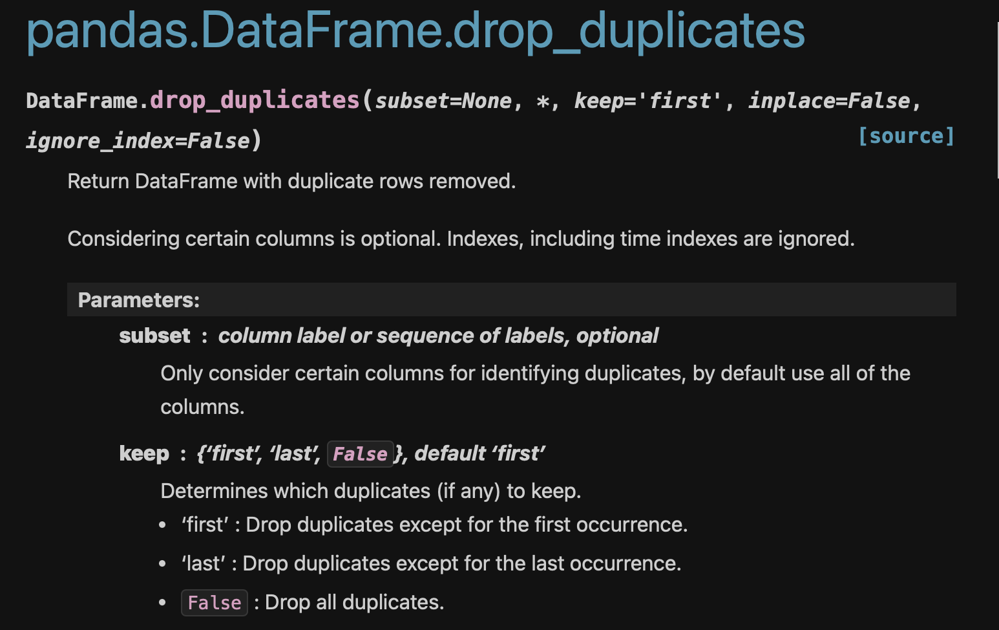

# ข้อมูลบางตัวในชุดข้อมูลมีลักษณะผิดปกติหรือแตกต่างจากข้อมูลส่วนใหญ่ (Outlier)

# ค่าตัวแปรบางตัวที่ไม่ถูกต้อง (Erroneous Data)

In [78]:
unit_type_data = pd.read_csv("/content/drive/MyDrive/Data prepare & Data Mining/bsc_dpdm24_data/opendata_unittype.csv")
unit_type_data.head()

,row_number,unittype_id,project_id,name_th,propertytype_id,propertytype_name_en,propertytype_name_th,area_total_min_wa,area_usable_min,price_min,...,count_room_kitchen,count_room_living,count_room_maid,count_room_storage,count_room_utility,date_created,date_updated,source,url_unittype,day
0,4441,unittype_11075,project_3853,4 Bedroom,2,Condo,คอนโด,NaN,250.0,50200000.0,...,NaN,NaN,NaN,NaN,NaN,2021-11-12 13:20:56,2020-10-14 00:57:57,baania,https://baania.com/th/project/โดมัส-16-3853/4-...,2023-08-31
1,28021,unittype_18174,project_7334,ทาวน์โฮมสองชั้น,3,Townhome,ทาวน์โฮม,NaN,132.0,3666666.0,...,NaN,1.0,NaN,NaN,NaN,2020-12-04 10:37:28,2020-10-14 00:43:47,baania,https://baania.com/th/project/บ้านเมฆธารา-2-73...,2023-08-31
2,14541,unittype_35595,project_15267,1 Bedroom,2,Condo,คอนโด,NaN,45.0,3250000.0,...,NaN,NaN,NaN,NaN,NaN,2021-11-12 13:20:30,2020-10-14 00:55:24,baania,https://baania.com/th/project/เดอะ-เซสท์-ลาดพร...,2023-08-31
3,21478,6305c503713e23001a6a67b3,6305c4af713e23001a6a67af,1 Bedroom,2,Condo,คอนโด,NaN,25.0,989000.0,...,NaN,NaN,NaN,NaN,NaN,2023-05-31 14:30:02,2023-05-31 14:13:32,baania,https://baania.com/th/project/เสนาคิทท์-บางนา-...,2023-08-31
4,11573,unittype_34957,project_5556,บ้านเดี่ยว SB2,1,Detached House,บ้าน,NaN,80.0,2140000.0,...,1.0,1.0,NaN,NaN,NaN,2023-03-23 12:00:05,2023-03-23 11:41:33,baania,https://baania.com/th/project/วี-อไลฟ์-ลำลูกกา...,2023-08-31


In [80]:
# prompt: checking for area_usable_min is anyone minus

# Check for negative values in 'area_usable_min'
negative_area_usable_min = unit_type_data[unit_type_data['area_usable_min'] < 0]

if not negative_area_usable_min.empty:
  print("There are negative values in 'area_usable_min':")
  print(negative_area_usable_min)
else:
  print("No negative values found in 'area_usable_min'.")

No negative values found in 'area_usable_min'.


# ข้อมูลมีค่าตัวแปรไม่สอดคล้องซึ่งกันและกัน (Inconsistent)

# Data Integration (การรวมข้อมูลจากแหล่งข้อมูลหลายๆ แหล่ง)

## 1. รวมแกน row (add rows - เพิ่ม Data)

เกิดตอนที่ data ที่มีหลายเวอชัน มีหลายๆปี แล้วนำมาต่อกัน

In [81]:
unit_type_data = pd.read_csv("/content/drive/MyDrive/Data prepare & Data Mining/bsc_dpdm24_data/opendata_unittype.csv")
living_score_data = pd.read_csv("/content/drive/MyDrive/Data prepare & Data Mining/bsc_dpdm24_data/opendata_living_score.csv")

In [82]:
# prompt: เเยกตาราง row_number กับ day ออกมาจากทั้งสองตารางแล้วต่อกันเรียงตาม row_number รวมเเกน row

import pandas as pd

# Assuming your dataframes are named unit_type_data and living_score_data
# and they both have 'row_number' and 'day' columns.

# Select 'row_number' and 'day' columns from both dataframes
unit_type_subset = unit_type_data[['row_number', 'day']]
living_score_subset = living_score_data[['row_number', 'day']]

# Concatenate the two subsets along the row axis (axis=0)
combined_data = pd.concat([unit_type_subset, living_score_subset], axis=0)

# Sort the combined data by 'row_number'
combined_data = combined_data.sort_values('row_number')

# Display the combined data
combined_data

,row_number,day
34616,1,2023-08-31
79,1,2024-08-31
218,2,2024-08-31
28081,2,2023-08-31
322,3,2024-08-31
...,...,...
17546,43959,2023-08-31
24094,43960,2023-08-31
7862,43961,2023-08-31
11719,43962,2023-08-31


## 2. รวมแกน columns (add columns - เพิ่ม feature)
> เอาข้อมูลของ project มาใส่เพิ่ม merge map



In [83]:
unit_type_data = pd.read_csv("/content/drive/MyDrive/Data prepare & Data Mining/bsc_dpdm24_data/opendata_unittype.csv")
unit_type_data

,row_number,unittype_id,project_id,name_th,propertytype_id,propertytype_name_en,propertytype_name_th,area_total_min_wa,area_usable_min,price_min,...,count_room_kitchen,count_room_living,count_room_maid,count_room_storage,count_room_utility,date_created,date_updated,source,url_unittype,day
0,4441,unittype_11075,project_3853,4 Bedroom,2,Condo,คอนโด,NaN,250.0,50200000.0,...,NaN,NaN,NaN,NaN,NaN,2021-11-12 13:20:56,2020-10-14 00:57:57,baania,https://baania.com/th/project/โดมัส-16-3853/4-...,2023-08-31
1,28021,unittype_18174,project_7334,ทาวน์โฮมสองชั้น,3,Townhome,ทาวน์โฮม,NaN,132.0,3666666.0,...,NaN,1.0,NaN,NaN,NaN,2020-12-04 10:37:28,2020-10-14 00:43:47,baania,https://baania.com/th/project/บ้านเมฆธารา-2-73...,2023-08-31
2,14541,unittype_35595,project_15267,1 Bedroom,2,Condo,คอนโด,NaN,45.0,3250000.0,...,NaN,NaN,NaN,NaN,NaN,2021-11-12 13:20:30,2020-10-14 00:55:24,baania,https://baania.com/th/project/เดอะ-เซสท์-ลาดพร...,2023-08-31
3,21478,6305c503713e23001a6a67b3,6305c4af713e23001a6a67af,1 Bedroom,2,Condo,คอนโด,NaN,25.0,989000.0,...,NaN,NaN,NaN,NaN,NaN,2023-05-31 14:30:02,2023-05-31 14:13:32,baania,https://baania.com/th/project/เสนาคิทท์-บางนา-...,2023-08-31
4,11573,unittype_34957,project_5556,บ้านเดี่ยว SB2,1,Detached House,บ้าน,NaN,80.0,2140000.0,...,1.0,1.0,NaN,NaN,NaN,2023-03-23 12:00:05,2023-03-23 11:41:33,baania,https://baania.com/th/project/วี-อไลฟ์-ลำลูกกา...,2023-08-31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43958,24030,64a69b679ac98e00137baccc,64a69aa99ac98e00137bacc5,บ้านเดี่ยวชั้นเดียว,1,Detached House,บ้าน,NaN,80.0,NaN,...,NaN,NaN,NaN,NaN,NaN,2023-07-13 18:30:02,2023-07-13 18:08:11,baania,https://baania.com/th/project/พาราวิลล์-7-64a6...,2023-08-31
43959,27439,unittype_13626,project_5336,1 Bedroom,2,Condo,คอนโด,NaN,32.0,1900000.0,...,NaN,NaN,NaN,NaN,NaN,2021-11-12 13:33:33,2021-07-15 15:18:28,baania,https://baania.com/th/project/เวนโต้-คอนโด-เกษ...,2023-08-31
43960,1780,unittype_5858,project_1921,Delux Type E,2,Condo,คอนโด,NaN,35.0,1870000.0,...,1.0,1.0,NaN,NaN,NaN,2022-10-17 12:00:18,2022-10-17 11:51:21,baania,https://baania.com/th/project/ริเวนเดลล์-แอปโซ...,2023-08-31
43961,19135,60c0850ce5834700138692ac,project_13885,1 Bedroom Plus,2,Condo,คอนโด,NaN,30.5,2490000.0,...,NaN,NaN,NaN,NaN,1.0,2023-06-12 14:30:03,2023-06-12 14:15:31,baania,https://baania.com/th/project/เคนซิงตัน-สุขุมว...,2023-08-31


In [84]:
living_score_data = pd.read_csv("/content/drive/MyDrive/Data prepare & Data Mining/bsc_dpdm24_data/opendata_living_score.csv")
living_score_data

,row_number,subdistrict_id,subdistrict_name_en,subdistrict_name_th,district_id,district_name_en,district_name_th,province_id,province_name_en,province_name_th,...,access_train,access_total,drive_leisure,drive_public_service,drive_school,drive_shopping,drive_work,drive_total,source,day
0,30,3405,BANG RAK PHATTHANA,บางรักพัฒนา,3402,BANG BUA THONG,บางบัวทอง,3372,Nonthaburi,นนทบุรี,...,3.0,77.0,99.0,100.0,98.0,100.0,100.0,100.0,baania,2024-08-31
1,90,3527,RACHA THEWA,ราชาเทวะ,3522,BANG PHLI,บางพลี,3498,Samut Prakan,สมุทรปราการ,...,0.0,49.0,92.0,90.0,80.0,95.0,99.0,93.0,baania,2024-08-31
2,270,3526,BANG PLA,บางปลา,3522,BANG PHLI,บางพลี,3498,Samut Prakan,สมุทรปราการ,...,0.0,12.0,94.0,94.0,96.0,98.0,100.0,97.0,baania,2024-08-31
3,86,3669,DON YAI HOM,ดอนยายหอม,3668,MUEANG NAKHON PATHOM,เมืองนครปฐม,3667,Nakhon Pathom,นครปฐม,...,0.0,0.0,73.0,91.0,73.0,100.0,100.0,91.0,baania,2024-08-31
4,57,3835,SALA THAMMASOP,ศาลาธรรมสพน์,3833,THAWI WATTHANA,ทวีวัฒนา,3781,Bangkok,กรุงเทพมหานคร,...,1.0,30.0,88.0,41.0,94.0,64.0,23.0,66.0,baania,2024-08-31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
340,265,3922,WANG BURAPHA PHIROM,วังบูรพาภิรมย์,3915,PHRA NAKHON,พระนคร,3781,Bangkok,กรุงเทพมหานคร,...,100.0,100.0,100.0,80.0,100.0,100.0,100.0,98.0,baania,2024-08-31
341,224,3897,PATHUM WAN,ปทุมวัน,3896,PATHUM WAN,ปทุมวัน,3781,Bangkok,กรุงเทพมหานคร,...,100.0,100.0,100.0,90.0,100.0,100.0,100.0,99.0,baania,2024-08-31
342,319,3794,BANG CHAN,บางชัน,3791,KHLONG SAM WA,คลองสามวา,3781,Bangkok,กรุงเทพมหานคร,...,1.0,19.0,98.0,54.0,100.0,92.0,91.0,90.0,baania,2024-08-31
343,19,3399,MAHASAWAT,มหาสวัสดิ์,3392,BANG KRUAI,บางกรวย,3372,Nonthaburi,นนทบุรี,...,1.0,40.0,97.0,100.0,93.0,100.0,100.0,98.0,baania,2024-08-31


###2.1 merge

In [85]:
# prompt: รวมแกน columnsด้วยการ merge ตาราง unit_type_data กับ living_score_data ด้วยคอลัมrow_number

merged_data = pd.merge(unit_type_data, living_score_data, on='row_number', how='left')
merged_data

,row_number,unittype_id,project_id,name_th,propertytype_id,propertytype_name_en,propertytype_name_th,area_total_min_wa,area_usable_min,price_min,...,access_train,access_total,drive_leisure,drive_public_service,drive_school,drive_shopping,drive_work,drive_total,source_y,day_y
0,4441,unittype_11075,project_3853,4 Bedroom,2,Condo,คอนโด,NaN,250.0,50200000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,28021,unittype_18174,project_7334,ทาวน์โฮมสองชั้น,3,Townhome,ทาวน์โฮม,NaN,132.0,3666666.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,14541,unittype_35595,project_15267,1 Bedroom,2,Condo,คอนโด,NaN,45.0,3250000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,21478,6305c503713e23001a6a67b3,6305c4af713e23001a6a67af,1 Bedroom,2,Condo,คอนโด,NaN,25.0,989000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,11573,unittype_34957,project_5556,บ้านเดี่ยว SB2,1,Detached House,บ้าน,NaN,80.0,2140000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43958,24030,64a69b679ac98e00137baccc,64a69aa99ac98e00137bacc5,บ้านเดี่ยวชั้นเดียว,1,Detached House,บ้าน,NaN,80.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
43959,27439,unittype_13626,project_5336,1 Bedroom,2,Condo,คอนโด,NaN,32.0,1900000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
43960,1780,unittype_5858,project_1921,Delux Type E,2,Condo,คอนโด,NaN,35.0,1870000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
43961,19135,60c0850ce5834700138692ac,project_13885,1 Bedroom Plus,2,Condo,คอนโด,NaN,30.5,2490000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### 2.2 map



In [86]:
# prompt: map ตาราง unit_type_data กับ living_score_data ด้วย row_number


# Check for negative values in 'area_usable_min' (as in the original code)
negative_area_usable_min = unit_type_data[unit_type_data['area_usable_min'] < 0]

if not negative_area_usable_min.empty:
  print("There are negative values in 'area_usable_min':")
  print(negative_area_usable_min)
else:
  print("No negative values found in 'area_usable_min'.")

# Create a dictionary to map 'row_number' to 'living_score'
living_score_map = dict(zip(living_score_data['row_number'], living_score_data['row_number']))

# Map the living_score to the unit_type_data DataFrame
unit_type_data['row_numbere'] = unit_type_data['row_number'].map(living_score_map)

# Display the updated DataFrame
unit_type_data.head()

No negative values found in 'area_usable_min'.


,row_number,unittype_id,project_id,name_th,propertytype_id,propertytype_name_en,propertytype_name_th,area_total_min_wa,area_usable_min,price_min,...,count_room_living,count_room_maid,count_room_storage,count_room_utility,date_created,date_updated,source,url_unittype,day,row_numbere
0,4441,unittype_11075,project_3853,4 Bedroom,2,Condo,คอนโด,NaN,250.0,50200000.0,...,NaN,NaN,NaN,NaN,2021-11-12 13:20:56,2020-10-14 00:57:57,baania,https://baania.com/th/project/โดมัส-16-3853/4-...,2023-08-31,NaN
1,28021,unittype_18174,project_7334,ทาวน์โฮมสองชั้น,3,Townhome,ทาวน์โฮม,NaN,132.0,3666666.0,...,1.0,NaN,NaN,NaN,2020-12-04 10:37:28,2020-10-14 00:43:47,baania,https://baania.com/th/project/บ้านเมฆธารา-2-73...,2023-08-31,NaN
2,14541,unittype_35595,project_15267,1 Bedroom,2,Condo,คอนโด,NaN,45.0,3250000.0,...,NaN,NaN,NaN,NaN,2021-11-12 13:20:30,2020-10-14 00:55:24,baania,https://baania.com/th/project/เดอะ-เซสท์-ลาดพร...,2023-08-31,NaN
3,21478,6305c503713e23001a6a67b3,6305c4af713e23001a6a67af,1 Bedroom,2,Condo,คอนโด,NaN,25.0,989000.0,...,NaN,NaN,NaN,NaN,2023-05-31 14:30:02,2023-05-31 14:13:32,baania,https://baania.com/th/project/เสนาคิทท์-บางนา-...,2023-08-31,NaN
4,11573,unittype_34957,project_5556,บ้านเดี่ยว SB2,1,Detached House,บ้าน,NaN,80.0,2140000.0,...,1.0,NaN,NaN,NaN,2023-03-23 12:00:05,2023-03-23 11:41:33,baania,https://baania.com/th/project/วี-อไลฟ์-ลำลูกกา...,2023-08-31,NaN


# Data Reduction (การลดปริมาณข้อมูลในการวิเคราะห์ข้อมูล)

## Reuduce number of data (row-axis) - Sampling

### Sampling แบบกำหนดค่า seed

In [87]:
unit_type_data.sample(random_state=6)

,row_number,unittype_id,project_id,name_th,propertytype_id,propertytype_name_en,propertytype_name_th,area_total_min_wa,area_usable_min,price_min,...,count_room_living,count_room_maid,count_room_storage,count_room_utility,date_created,date_updated,source,url_unittype,day,row_numbere
25260,35735,unittype_30359,project_12826,อาคารพาณิชย์สามชั้น,4,Commercial,อาคารพาณิชย์,NaN,68.0,3900000.0,...,NaN,NaN,NaN,NaN,2020-12-04 10:44:37,2020-10-14 21:43:07,baania,https://baania.com/th/project/บีแอลพลาซ่า-1282...,2023-08-31,NaN


### Sampling แบบกำหนดค่า n จำนวนค่าที่ถูกสุ่ม

In [88]:
unit_type_data.sample(10, random_state=6)

,row_number,unittype_id,project_id,name_th,propertytype_id,propertytype_name_en,propertytype_name_th,area_total_min_wa,area_usable_min,price_min,...,count_room_living,count_room_maid,count_room_storage,count_room_utility,date_created,date_updated,source,url_unittype,day,row_numbere
25260,35735,unittype_30359,project_12826,อาคารพาณิชย์สามชั้น,4,Commercial,อาคารพาณิชย์,NaN,68.00,3900000.0,...,NaN,NaN,NaN,NaN,2020-12-04 10:44:37,2020-10-14 21:43:07,baania,https://baania.com/th/project/บีแอลพลาซ่า-1282...,2023-08-31,NaN
40029,42856,5fa231b0d0235b0019c19605,5fa22fefc7e77400194375bc,AG2,1,Detached House,บ้าน,NaN,101.84,3750000.0,...,1.0,NaN,1.0,NaN,2022-05-31 14:00:08,2022-05-31 13:46:38,baania,https://baania.com/th/project/อัญชัน-การ์เด้น-...,2023-08-31,NaN
15309,8477,unittype_8734,project_2984,1 Bedroom Plus,2,Condo,คอนโด,NaN,31.00,2590000.0,...,1.0,NaN,NaN,NaN,2021-11-12 13:20:48,2020-10-14 00:57:13,baania,https://baania.com/th/project/เอชทู-โกลว์-2984...,2023-08-31,NaN
40379,25911,unittype_10544,project_3660,ชีวานันท์,1,Detached House,บ้าน,NaN,238.00,5140000.0,...,1.0,NaN,1.0,NaN,2021-11-12 13:19:39,2020-10-14 00:40:11,baania,https://baania.com/th/project/ชีวารมย์-รังสิต-...,2023-08-31,NaN
17397,36540,unittype_16429,project_6477,B(B2),2,Condo,คอนโด,NaN,25.00,2190000.0,...,1.0,NaN,NaN,NaN,2021-11-12 13:31:06,2021-03-18 15:26:42,baania,https://baania.com/th/project/น็อตติ้ง-ฮิลล์-ส...,2023-08-31,NaN
32745,11816,unittype_35009,project_15036,3 Bedroom,2,Condo,คอนโด,NaN,146.00,25900000.0,...,NaN,NaN,NaN,NaN,2021-11-12 13:20:28,2020-10-14 00:55:11,baania,https://baania.com/th/project/บ้านสิริ-ทเวนตี้...,2023-08-31,NaN
20853,37518,unittype_23708,project_9470,บ้านเดี่ยวชั้นเดียว,1,Detached House,บ้าน,50.8,98.00,2300000.0,...,1.0,NaN,1.0,NaN,2021-11-12 13:28:43,2021-01-13 15:10:06,baania,https://baania.com/th/project/เอสซี-ฮิลล์-2-อี...,2023-08-31,NaN
9952,9482,unittype_28255,project_11532,บ้านเดี่ยวชั้นเดียว,1,Detached House,บ้าน,NaN,95.00,1500000.0,...,NaN,NaN,NaN,NaN,2020-12-04 10:38:17,2020-10-14 00:49:20,baania,https://baania.com/th/project/บ้านแซมไอซ์วิลล่...,2023-08-31,NaN
27605,36142,unittype_2172,project_1097,บ้านรุ่งฤดี,1,Detached House,บ้าน,NaN,152.00,1900000.0,...,NaN,NaN,NaN,NaN,2022-10-17 12:00:07,2022-10-17 11:32:31,baania,https://baania.com/th/project/บ้านรุ่งอรุณ-3-1...,2023-08-31,NaN
5899,3004,unittype_8771,project_2976,Metro,3,Townhome,ทาวน์โฮม,NaN,175.00,4490000.0,...,1.0,NaN,1.0,NaN,2021-11-12 13:24:13,2020-10-14 22:42:14,baania,https://baania.com/th/project/พาทิโอ-งามวงศ์วา...,2023-08-31,NaN


### Sampling แบบกำหนดเป็น %

In [90]:
unit_type_data.sample(frac=0.2, random_state=6)
# frac %

,row_number,unittype_id,project_id,name_th,propertytype_id,propertytype_name_en,propertytype_name_th,area_total_min_wa,area_usable_min,price_min,...,count_room_living,count_room_maid,count_room_storage,count_room_utility,date_created,date_updated,source,url_unittype,day,row_numbere
25260,35735,unittype_30359,project_12826,อาคารพาณิชย์สามชั้น,4,Commercial,อาคารพาณิชย์,NaN,68.00,3900000.0,...,NaN,NaN,NaN,NaN,2020-12-04 10:44:37,2020-10-14 21:43:07,baania,https://baania.com/th/project/บีแอลพลาซ่า-1282...,2023-08-31,NaN
40029,42856,5fa231b0d0235b0019c19605,5fa22fefc7e77400194375bc,AG2,1,Detached House,บ้าน,NaN,101.84,3750000.0,...,1.0,NaN,1.0,NaN,2022-05-31 14:00:08,2022-05-31 13:46:38,baania,https://baania.com/th/project/อัญชัน-การ์เด้น-...,2023-08-31,NaN
15309,8477,unittype_8734,project_2984,1 Bedroom Plus,2,Condo,คอนโด,NaN,31.00,2590000.0,...,1.0,NaN,NaN,NaN,2021-11-12 13:20:48,2020-10-14 00:57:13,baania,https://baania.com/th/project/เอชทู-โกลว์-2984...,2023-08-31,NaN
40379,25911,unittype_10544,project_3660,ชีวานันท์,1,Detached House,บ้าน,NaN,238.00,5140000.0,...,1.0,NaN,1.0,NaN,2021-11-12 13:19:39,2020-10-14 00:40:11,baania,https://baania.com/th/project/ชีวารมย์-รังสิต-...,2023-08-31,NaN
17397,36540,unittype_16429,project_6477,B(B2),2,Condo,คอนโด,NaN,25.00,2190000.0,...,1.0,NaN,NaN,NaN,2021-11-12 13:31:06,2021-03-18 15:26:42,baania,https://baania.com/th/project/น็อตติ้ง-ฮิลล์-ส...,2023-08-31,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17888,9005,unittype_28015,project_11452,บ้านเดี่ยวชั้นเดียว,1,Detached House,บ้าน,NaN,120.00,2200000.0,...,NaN,NaN,NaN,NaN,2020-12-04 10:36:20,2020-10-14 00:36:41,baania,https://baania.com/th/project/บ้านชาญสมร-11452...,2023-08-31,NaN
10518,15098,unittype_36829,project_15923,อาคารพาณิชย์สามชั้น,4,Commercial,อาคารพาณิชย์,NaN,180.00,3990000.0,...,NaN,NaN,NaN,NaN,2021-11-12 13:20:21,2020-10-14 00:53:37,baania,https://baania.com/th/project/พาสิริ-ธารา-5-15...,2023-08-31,NaN
6364,4842,unittype_16826,project_6679,บ้านเดี่ยวสองชั้น Type A,1,Detached House,บ้าน,NaN,140.00,3100000.0,...,NaN,NaN,NaN,NaN,2020-12-04 10:37:08,2020-10-14 00:41:36,baania,https://baania.com/th/project/บ้านเมืองเอก-6-6...,2023-08-31,NaN
27351,32803,unittype_37293,project_16274,บ้านเดี่ยวสองชั้น,1,Detached House,บ้าน,NaN,300.00,9550000.0,...,NaN,NaN,NaN,NaN,2021-07-16 10:30:03,2021-07-16 10:14:56,baania,https://baania.com/th/project/เลคไซค์-คอร์ท-5-...,2023-08-31,NaN


### Sampling แบบคืนค่า

In [91]:
sam_no_replc = unit_type_data.sample(frac=0.2, random_state=6)
sam_no_replc.duplicated().any() # ไม่ซ้ำ จับรอบเดียว

False

In [92]:
sam_with_replc = unit_type_data.sample(frac=0.2, replace=True, random_state=6)
sam_with_replc.duplicated().any() # If output = True that mean some data has random > 2

True

### Sampling แบบเพิ่มจำนวนข้อมูล

In [93]:
sam_with_replc_120 = unit_type_data.sample(frac=1.2, replace=True, random_state=6)
sam_with_replc_120.shape

(52756, 29)

In [ ]:
sam_with_replc = shopping_data.sample(frac=0.2, replace=True, random_state=6)
sam_with_replc.duplicated().any() # Output=True แสดงว่า มีบาง data ที่ถูกสุ่มมา 2 รอบ

True

### Sampling แบบเพิ่มจำนวนข้อมูล

In [ ]:
sam_with_replc_120 = shopping_data.sample(frac=1.2, replace=True, random_state=6)
sam_with_replc_120.shape

(119348, 10)